Team:
* Bhakti Soni, b.soni@lse.ac.uk
* Maria Isabel Delgadillo, m.i.delgadillo-jimenez@lse.ac.edu

# <font color='#7f4362'>How has admission into LSE changed over 2015 to 2023?</font>

### <font color='#d96648'>Table of Contents</font>
1. [Introduction](#Introduction)
    1. [Motivation](#Motivation)
    2. [Research Questions](#research_questions)
    3. [Project Overview](#project_overview)
2. [Part 1](#part_1)
    1. [Data Acquisition](#data_acquisition)
    2. [Data Cleaning](#data_cleaning)
    3. [EDA](#eda)
    4. [Part 1 Concluding Thoughts](#part_1_concluding_thoughts)
3. [Part 2](#part_2)
    1. [Data Cleaning](#data_cleaning_2)
    2. [EDA](#eda_2)
    3. [Data Acquisition](#data_acquisition_3)
    4. [Data Cleaning](#data_cleaning_3)
    5. [EDA](#eda_3)
4. [Conclusion](#Conclusion)

##  <font color='#ae5051'>Introduction</font>

###  <font color='#d96648'>Motivation</font>

With the extensive effects of the pandemic on academia and the growing popularity of apprenticeships, online degrees, and other alternative higher education methods, we were curious to understand how admission into LSE has changed from 2015-2023.

<a id='research_questions'></a>
###  <font color='#d96648'>Research Questions</font>

#### How has the popularity of LSE's undergraduate degrees as well as admission difficulty changed from 2015-2023?
#### How has the public perception of LSE's top courses changed?

<a id='project_overview'></a>
###  <font color='#d96648'>Project Overview</font>

In this report, we consider the changes in different variables within LSE's admission data, such as the number of applications, the corresponding numbers for offers, and final acceptance. By considering how these have changed over time, we can draw conclusions regarding how admission difficulty, LSE popularity, and more have changed over time.

The first part of our project focuses on admission data over time per department because this would show which areas of studies have become more or less popular for prospective students. We specifically focused on overall application numbers and offer ratios per department and used EDA to display the raw data from which we have drawn conclusions, especially by comparing the graphs in conjunction.

The second part focuses on five specific undergraduate degree programs which were picked by highest application numbers because that gives us a deeper and more specific understanding of the changing trends for the more popular departments. We used the original dataset to gather information similar to part one but combined it with scraping from Reddit so we can draw our final conclusions about the public sentiment towards these degrees from prospective students' words.

<a id='part_1'></a>
# <font color='#7f4362'>Part 1</font>

<a id='data_acquisition'></a>
##  <font color='#ae5051'>Data Acquisition</font>


For part one of the report we have gathered data from multiple data sources:
1. WhatDoTheyKnow.com to gather the admission information from 2015-2019 which was available as two different excel files from previous requests. Then for 2020-2023 we requested the data from LSE under the FOI act and we recieved the data in the form of a table in Tableau Public. We gathered the intial data in early March 2023 and we requested this at the end of March 2023 and recieved a reply in early April 2023.
2. LSE's Statistics on Students website to collect the data from 2018-2019 becuase that was not provided within the FOI request we made. However, this only gave the data for the final admissions. We collected this in early April 2023
3. Admission Report to gather the application numbers and offer numbers for the years 2018-2019 in order to complete our data collection. We collected this in early April 2023.

From the first three sources we collated all the data into one excel file and then concatenated the sheets to generate a dataframe to use for the project. We have stored this excel file in the data folder of this project repository.

<a id='data_cleaning'></a>
##  <font color='#ae5051'>Data Cleaning</font>


This section contains the following steps to clean the dataset: 
 1. Saving Excel files as dataframes
 2. Filtering the sheets we want to use
 3. Reformatting data
 4. Isolate departments data onto two dataframes, one for applications and another for acceptances

#### Saving Excel Files as Data Frames
We started with the excel file to read each excel sheet as a clean Pandas DataFrame.

In [23]:
import matplotlib.pyplot as plt
import pandas as pd

file_name = 'data/ST115 data.xlsx'
sheet_to_df_map = pd.read_excel(file_name, sheet_name=None)

xls = pd.ExcelFile('data/ST115 data.xlsx')
xls.sheet_names

df = pd.read_excel('data/ST115 data.xlsx', sheet_name = '2022-3')

df.head(20)

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4
0,NaN,NaN,Applications,Offers,Registrations
1,NaN,Accounting,1962,261,114
2,NaN,BSc in Accounting and Finance,1962,261,114
3,NaN,Anthropology,671,232,76
4,NaN,BA in Anthropology and Law,326,33,18
5,NaN,BA in Social Anthropology,245,151,46
6,NaN,BSc in Social Anthropology,100,48,12
7,NaN,Economic History,980,130,74
8,NaN,BSc in Economic History,359,63,26
9,NaN,BSc in Economic History and Geography,85,19,13


#### Filtering the Sheets we Want to Use
Not all of the sheets in the file were relevant, so the titles of the ones we wanted to use were in the `headers` variable

In [24]:
xls.sheet_names

['2015-6',
 '2016-7',
 '2017-8',
 '2018-9',
 '2018-9 (Original)',
 '2019-20',
 '2020-1',
 '2020-1(Original)',
 '2021-2',
 '2021-2 (Original)',
 '2022-3',
 '2022-3 (Original)']

In [25]:
headers = ['2015-6',
 '2016-7',
 '2017-8',
 '2018-9',
 '2019-20',
 '2020-1',
 '2021-2',
 '2022-3']

#### Filtering Rows to Keep Department Data


In [26]:
year_data = [pd.read_excel('data/ST115 data.xlsx', sheet_name = year, header=1, index_col= 1).drop('Unnamed: 0', 
                                                   axis=1).rename_axis('Degree') for year in headers]

year_data[0].head(15)

,Applications,Offers,Acceptances
Degree,,,
Accounting,1851,215,173
BSc in Accounting and Finance,1851,215,173
Anthropology,430,173,87
BA in Anthropology and Law,137,30,27
BA in Social Anthropology,208,112,53
BSc in Social Anthropology,85,31,7
Economic History,565,118,93
BSc in Economic History,216,58,46
BSc in Economic History with Economics,49,4,4


Then we extracted the rows concerning the departments only.

In [27]:
filtered_rows = []

for i in range(len(headers)):
    filtered_rows.extend(year_data[i][~year_data[i].index.str.contains(r'\b(BA|BSc|LLB)\b')].index.to_list())
filtered_rows = list(set(filtered_rows))

filtered_rows.remove('Grand Total')

filtered_rows

/var/folders/k2/x0g11r2s46j6w8yqkv5vvsqm0000gq/T/ipykernel_13614/891152806.py:4: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  filtered_rows.extend(year_data[i][~year_data[i].index.str.contains(r'\b(BA|BSc|LLB)\b')].index.to_list())


['Psychological and Behavioural Science',
 'Language Centre',
 'International History',
 'Anthropology',
 'Economic History',
 'Geography & Environment',
 'Accounting',
 'Sociology',
 'Government',
 'Social Policy',
 'Mathematics',
 'Statistics',
 'Philosophy, Logic and Scientific Method',
 'Economics',
 'Management',
 'Law',
 'Finance',
 'International Relations']

In [28]:
department_dfs = []

for i in range(len(headers)):
    filtered_df = pd.DataFrame(columns = year_data[i].columns)
    for row in filtered_rows:
        try:
            filtered_df.loc[row] = year_data[i].loc[row]
        except KeyError:
            filtered_df.loc[row] = pd.Series(index=year_data[i].columns, dtype=object)
    department_dfs.append(filtered_df)

department_dfs[0].head(10)

,Applications,Offers,Acceptances
Psychological and Behavioural Science,NaN,NaN,NaN
Language Centre,NaN,NaN,NaN
International History,821,270,116
Anthropology,430,173,87
Economic History,565,118,93
Geography & Environment,621,219,112
Accounting,1851,215,173
Sociology,267,116,66
Government,1669,354,246
Social Policy,417,110,62


Then we concated the different sheets into one table by using the sum of Application numbers

In [29]:
applications_list = []
for df in department_dfs:
    applications_list.append(df['Applications'])

applications_df = pd.concat(applications_list, axis=1, keys=headers).fillna(0)
applications_df.head(10)

,2015-6,2016-7,2017-8,2018-9,2019-20,2020-1,2021-2,2022-3
Psychological and Behavioural Science,0,0,0.0,675,372,530,670,788
Language Centre,0,0,0.0,315,329,347,314,314
International History,821,807,787.0,739,805,716,735,760
Anthropology,430,461,488.0,612,566,563,1623,671
Economic History,565,600,572.0,1016,687,735,1015,980
Geography & Environment,621,679,698.0,967,739,879,960,1083
Accounting,1851,1540,1536.0,1895,1719,1788,1881,1962
Sociology,267,290,286.0,528,358,465,525,567
Government,1669,1830,1889.0,2924,2408,2492,2913,3123
Social Policy,417,379,438.0,916,617,673,908,948


We also concatenated the different sheets into one table by using the offer ratios for each department. The offer ratio is the sum of offers/sum of applications.

In [30]:
ratios_df = pd.DataFrame()

i = 0 
for df in department_dfs:
  
    ratios_df[headers[i]] = 100*df['Offers'] / df['Applications']
    i+=1

ratios_df.columns = headers
ratios_df.fillna(0).head(10)

,2015-6,2016-7,2017-8,2018-9,2019-20,2020-1,2021-2,2022-3
Psychological and Behavioural Science,0.000000,0.000000,0.000000,16.444444,29.301075,25.471698,16.716418,20.431472
Language Centre,0.000000,0.000000,0.000000,26.666667,20.972644,29.106628,28.025478,33.439490
International History,32.886724,32.465923,37.229987,26.792963,42.484472,51.396648,29.659864,41.184211
Anthropology,40.232558,40.130152,36.475410,25.816993,36.749117,40.497336,10.166359,34.575261
Economic History,20.884956,19.333333,21.153846,8.858268,15.283843,18.775510,10.246305,13.265306
Geography & Environment,35.265700,33.136966,33.237822,18.614271,41.542625,36.177474,20.937500,22.345337
Accounting,11.615343,14.545455,16.210938,9.234828,15.532286,17.337808,9.356725,13.302752
Sociology,43.445693,41.724138,45.804196,20.454545,44.692737,37.634409,21.333333,21.693122
Government,21.210306,20.491803,19.163579,9.883721,17.358804,17.616372,10.744936,16.138329
Social Policy,26.378897,25.857520,26.940639,9.716157,24.959481,27.637444,11.123348,16.772152


<a id='eda'></a>
##  <font color='#ae5051'>Exploratory Data Analysis (EDA)</font>

The data analysis in this part shows:
1. Visualisation of application numbers per department
2. Visualisation of offer rate per department

#### Application Data Visualisation

To start our analysis we plotted pie charts for all years to represent the relative sizes of each department using the applications numbers dataframe. We opted for displaying them as subplots so that it is structured and we emphasised the y-labels to identify which pie chart is for which year.

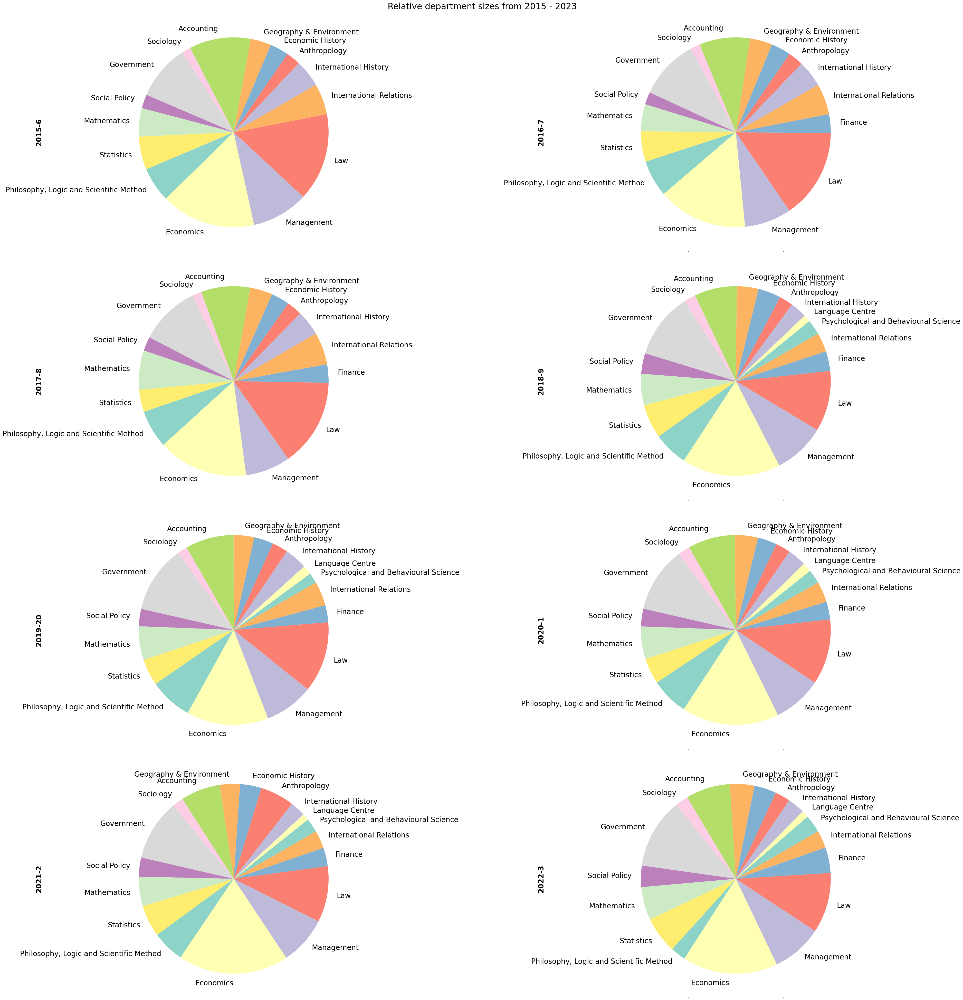

In [33]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['axes.prop_cycle'] = plt.cycler(color=plt.cm.get_cmap('Set3').colors)

plot = applications_df.plot.pie(subplots=True, figsize=(40, 40), legend=False, 
                               layout=(4,2), title = "Relative department sizes from 2015 - 2023", startangle = 30);


i = 0
for idx, x in np.ndenumerate(plot):         #loop over the ylabels for each subplot to make each label more clear
    x.set_ylabel(ylabel = headers[i], rotation=90, labelpad=200, fontweight="bold")
    i += 1    

plt.rcParams.update({'font.size': 30});
plt.tight_layout()

The plot above shows that over 8 years, majority of the departments have recieved a similar number of applications over the years, particularly Economics, Government and Accounting. However, the pie charts shows how some new departments have been introduced and how their popularity for applications has grown, namely Finance and the Language Centre. The plots show that Finance has stayed a similar size but the Language Centre has fluctuated in its size.

Though the pie charts give a good first overview of the data we realise that it's not the best way to understand the numerical differences in each department per year becuase many sections of the pie charts look similar. Using the fact that humans are better in comparing lengths from the baseline than areas or angles we decided to plot the department sizes in a stacked bar chart.

In [34]:
cmap = plt.cm.get_cmap('Set3')

# Set the default color cycle to the colormap
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=cmap.colors)


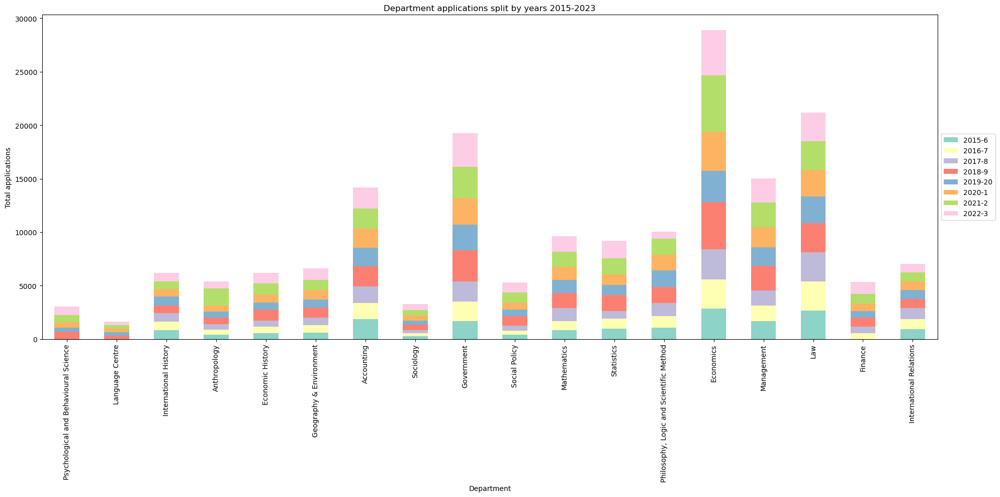

In [52]:
plot_2 = applications_df.plot.bar(figsize=(20, 10), rot=90, stacked=True, 
                                 title='Department applications split by years 2015-2023', legend = True);
plot_2.set_xlabel("Department");
plot_2.set_ylabel("Total applications");
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.rcParams.update({'font.size': 10})
plt.tight_layout()

This plot shows a better visualization of how the number of student applications has changed over time for each department. From here, we can see that although Economics had a similar share of the pie chart each year, the bar chart shows that the department was actually larger than usual in 2018-9, 2020 to 2023. This is a trend that we can also observe in other departments such as Management and Law.

Overall, it seems that many departments are receiving an increasing number of applications, and this trend is more visible for smaller departments such as Social Policy, Anthropology, and Finance, which are receiving more and more applications each year.

#### Offer Rate Visualisation

Next we wanted to understand how the offer rate has changed over time for each department so we used a line graph to display the offer ratios dataframe.

In [53]:
display = []
in_display = []

departments = list(ratios_df.index)
    
for i in range(len(departments)):
    
    in_display=[]
    
    for a in range(len(departments)):
        if a<i or a>i:
            in_display.append(False)
        else:
            in_display.append(True)
    display.append(in_display)

import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()

fig = go.Figure()


for i in range(len(ratios_df.T.columns)):
    fig.add_trace(go.Scatter(x=headers, y=ratios_df.T[departments[i]],
                        mode='lines', # 'lines' or 'markers'
                        name=departments[i]))

    
fig.update_xaxes(type='category')


buttons = []

buttons.append(dict(label= 'All Departments',
                        method= 'update',
                        args = [{'visible': True}]))

for i in range(len(departments)):
    buttons.append(dict(label= departments[i], 
                        method= 'update',
                        args= [{'visible': display[i]}], 
                        name= departments[i]))

fig.update_layout({
  'updatemenus':[{
    'type': "dropdown",
    'x': 1.5,
    'y': 1.5,
    'showactive': True,
    'active': 0,
    'buttons': buttons}]})

fig.update_layout(
    title="Offer Ratios over time per Department",
    xaxis_title="Years",
    yaxis_title="Offer Ratios",
    legend_title="Department:")

This interactive line graph shows how the percentage of applicants receiving offers has changed over time per department. There are many fluctuations for each department, but we can see three key points:

In 2018-2019, all departments experienced a significant drop in their offer rates. Why did that occur?
- For 2018-2019, we speculate that the offer rates dropped significantly because the majority of the departments experienced an increase in applications compared to previous years (as shown by the stacked bar chart above), but they didn't increase their possible intake of students. Therefore, they were making fewer offers compared to the number of applications.

All departments experienced an increase in the following two years. Hence, the drop was only temporary, but why?
- The drop was temporary because, in the following two years, each department received a lower number of applications, as seen from the stacked bar chart. Hence, the drop was temporary, but this raises the question of why there was a sudden increase in applications from 2018-2019 to LSE.

In 2021-2022, all departments once again faced a decrease in their offer rates. Why did another drop occur?
- For the drop in 2021-2022, we speculate that it was due to the effects of COVID-19. In the year 2020-2021, official exams were not taking place, and mock exam standards were different for each school, depending on the lockdown situation. Hence, the predicted grades of many students were likely to be skewed, so LSE is exhibiting caution in the number of offers they make considering this.

<a id='part_1_concluding_thoughts'></a>
####  <font color='#f28149'>Part 1 Concluding Thoughts</font>

Part 1 of our project gave us a basis of understanding regarding the data we had collected and how we could use it to answer our main questions. It also meant that we asked further questions, namely why do specific departments receive so many more applications than others and how do their offer ratios and application numbers compare to each other. We realized that the data we had couldn't explain the answers to these questions, so we devised a second part of the project focused on the larger departments and specifically the larger degrees within them.

<a id='part_2'></a>
# <font color='#7f4362'>Part 2</font>

<a id='data_cleaning_2'></a>
##  <font color='#ae5051'>Data Cleaning</font>

Data cleaning for obtaining courses is similar to obtaining the departments with the following steps:
1. Extracting undergraduate course titles
2. Creating a new dataframe for each year
3. Handling incorrectly formatted data
4. Single dataframe for top 5 courses 



#### Extracting Undergraduate Course Titles

As we are now working with the courses instead of the deparments, the rows concerning the departments are removed

In [60]:
undergrad_course_titles = []

for i in range(len(headers)):
    undergrad_course_titles.extend(year_data[i][year_data[i].index.str.contains(r'\b(BA|BSc|LLB)\b')].index.to_list())
undergrad_course_titles = list(set(undergrad_course_titles))

/var/folders/k2/x0g11r2s46j6w8yqkv5vvsqm0000gq/T/ipykernel_13614/3801596869.py:4: UserWarning:

This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.



In [61]:
undergrad_course_titles[:10]

['BSc in Statistics with Finance',
 'BSc in International Relations and Chinese',
 'BSc in Mathematics with Economics',
 'BSc in Criminology',
 'BSc in Government',
 'BSc in Politics and Economics',
 'BSc in Mathematics and Economics',
 'BSc in Actuarial Science',
 'BSc in Politics and History',
 'BSc in Politics and International Relations']

#### Creating a New Dataframe for Each Year

In [62]:
courses_dfs = []

for i in range(len(headers)):
    filtered_df_2 = pd.DataFrame(columns = year_data[i].columns)
    for row in undergrad_course_titles:
        try:
            filtered_df_2.loc[row] = year_data[i].loc[row]
        except KeyError:
            filtered_df_2.loc[row] = pd.Series(index=year_data[i].columns, dtype=object)
    courses_dfs.append(filtered_df_2)
    

In [63]:
courses_dfs[0].head(5)

,Applications,Offers,Acceptances
BSc in Statistics with Finance,184.0,45.0,35.0
BSc in International Relations and Chinese,NaN,NaN,NaN
BSc in Mathematics with Economics,375.0,115.0,57.0
BSc in Criminology,NaN,NaN,NaN
BSc in Government,106.0,35.0,25.0


#### Handling Incorrectly Formatted Data
Data that is either shown as `'<10'` or a `NaN` value is changed to either `10` or `0`, and then all values in dataframes are converted to integers:

In [64]:
for i in range(len(courses_dfs)):
    courses_dfs[i] = courses_dfs[i].replace('<10', 10)
    courses_dfs[i] = courses_dfs[i].fillna(0).astype(int)
    
courses_dfs[0].head(5)

,Applications,Offers,Acceptances
BSc in Statistics with Finance,184,45,35
BSc in International Relations and Chinese,0,0,0
BSc in Mathematics with Economics,375,115,57
BSc in Criminology,0,0,0
BSc in Government,106,35,25


#### Single Dataframe for Top 5 Courses 

A single dataframe is created by concatenating the applications column for each year, and selecting only the rows that have data for the whole eight years.

In [65]:

applications_list_courses = []

for df2 in courses_dfs:
    applications_list_courses.append(df2['Applications'])
    
applications_df_courses = pd.concat(applications_list_courses, axis = 1, keys=headers)
applications_df_relevant_courses = applications_df_courses[(applications_df_courses != 0).all(axis=1)]
applications_df_relevant_courses.head(5)

,2015-6,2016-7,2017-8,2018-9,2019-20,2020-1,2021-2,2022-3
BSc in Mathematics with Economics,375,370,363,386,305,357,384,379
BSc in Mathematics and Economics,479,454,540,604,500,471,602,620
BSc in Actuarial Science,577,541,496,481,456,443,478,461
BSc in Politics and International Relations,789,906,874,1075,971,975,1072,1012
BSc in Geography with Economics,126,135,144,208,161,181,208,293


The top 5 courses are identified by the highest average aplication numbers. An additional column is added to the dataframe to make identifying the courses easier.

In [66]:
applications_df_relevant_courses['Average'] = applications_df_relevant_courses.mean(axis=1)

/var/folders/k2/x0g11r2s46j6w8yqkv5vvsqm0000gq/T/ipykernel_13614/1583313198.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [67]:
applications_df_relevant_courses.head(10)

,2015-6,2016-7,2017-8,2018-9,2019-20,2020-1,2021-2,2022-3,Average
BSc in Mathematics with Economics,375,370,363,386,305,357,384,379,364.875
BSc in Mathematics and Economics,479,454,540,604,500,471,602,620,533.750
BSc in Actuarial Science,577,541,496,481,456,443,478,461,491.625
BSc in Politics and International Relations,789,906,874,1075,971,975,1072,1012,959.250
BSc in Geography with Economics,126,135,144,208,161,181,208,293,182.000
BSc in Economic History,216,215,200,352,236,243,352,359,271.625
BA in Social Anthropology,208,219,211,204,227,195,202,245,213.875
BSc in Management,1702,1426,1404,2314,1749,1864,2303,2243,1875.625
BSc in Sociology,267,290,286,528,358,465,525,567,410.750
BSc in Environmental Policy with Economics,65,80,89,161,108,125,158,209,124.375


From this dataframe we took the 5 degrees with the highest number of applications because those are the degrees that are most popular and skew their respective department data the most. Insights into these five degrees can help us answer the questions we faced at the end of Part 1.

In [68]:
applications_df_relevant_courses.sort_values('Average', ascending=False).head(5)

,2015-6,2016-7,2017-8,2018-9,2019-20,2020-1,2021-2,2022-3,Average
BSc in Economics,2618,2502,2599,4128,2919,3315,4107,3927,3264.375
LLB in Laws,2644,2733,2751,2701,2525,2491,2667,2663,2646.875
BSc in Management,1702,1426,1404,2314,1749,1864,2303,2243,1875.625
BSc in Accounting and Finance,1851,1540,1536,1895,1719,1788,1881,1962,1771.500
BSc in Politics and International Relations,789,906,874,1075,971,975,1072,1012,959.250


In [69]:
top_average = applications_df_relevant_courses.sort_values('Average', ascending=False).head(5)

<a id='eda_2'></a>
##  <font color='#ae5051'>EDA</font>

To start our exploratory data analysis for Part 2, we plotted the application numbers for each degree over the years so we could compare the popularity of these degrees, specifically since they seem to be of similar sizes.

In [70]:
top_average_plot = top_average.iloc[:, :-1]

display_5 = []
in_display_5 = []

degrees = list(top_average.index)
    
for i in range(len(degrees)):
    
    in_display_5=[]
    
    for a in range(len(degrees)):
        if a<i or a>i:
            in_display_5.append(False)
        else:
            in_display_5.append(True)
    display_5.append(in_display_5)
    


In [71]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.offline as pyo
pyo.init_notebook_mode()

fig = go.Figure()


for i in range(len(top_average_plot.T.columns)):
    fig.add_trace(go.Scatter(x = headers, 
                             y=top_average_plot.T[degrees[i]],
                             mode='lines',
                             name=degrees[i]))

    
fig.update_xaxes(type='category')


buttons_2 = []

buttons_2.append(dict(label= 'All Degrees',
                        method= 'update',
                        args = [{'visible': [True, True, True, True, True]}]))

for i in range(len(degrees)):
    buttons_2.append(dict(label= degrees[i], 
                        method= 'update',
                        args= [{'visible': display_5[i]}], 
                        name= degrees[i]))

fig.update_layout({
  'updatemenus':[{
    'type': "dropdown",
    'x': 1.5,
    'y': 1.5,
    'showactive': True,
    'active': 0,
    'buttons': buttons_2}]})

fig.update_layout(
    title="Applications Over Time per Degree",
    xaxis_title="Years",
    yaxis_title="Applications",
    legend_title="Degrees:")

fig.show()

From this interactive plot, we can conclude that even within the top 5 undergraduate degrees of LSE, there are fluctuations in popularity. However, the LLB in Laws degree has displayed the least fluctuations in applications over time, while the BSc in Economics and BSc in Management have been more volatile. We can also see spikes in the 2018-2019 period, which, as stated in Part 1, could explain the lower offer ratios during that time.

This provides us with some answers regarding why some departments are much larger than others, which is because these departments offer degrees with some of the highest numbers of applications. As a result, the department is larger. We can also understand that the offer ratios must be heavily skewed by these degrees when the offer ratios are considered in terms of a whole department.

To understand why certain degrees are more popular with prospective students, we the Reddit API to recover posts that discuss LSE. This is because it is a well-known forum for discussion among students, and university applications are a significant topic within it.

<a id='data_acquisition_3'></a>
##  <font color='#ae5051'>Data Aquisition</font>

In this part, data adquisition is separaten into two parts:
1. Setting up the Reddit API
2. Making the requests

#### Setting Up the Reddit API

In [1]:
import json

with open('keys.json') as f:
    keys = json.load(f)
    
app_id = keys['reddit']['app_id']
app_secret = keys['reddit']['app_secret']
username = keys['reddit']['user_name']
password = keys['reddit']['password']

A New data adquisition is needex for the api, as we need more...

In [3]:
import requests.auth

client_auth = requests.auth.HTTPBasicAuth(app_id, app_secret)
post_data = {'grant_type': 'password', 
             'username': username, 
             'password': password}
headers = {'User-Agent': f'testing lse/0.0.1 by {username}'}

r = requests.post('https://www.reddit.com/api/v1/access_token',
                  auth=client_auth, data=post_data, headers=headers)

In [4]:
r

<Response [200]>

In [5]:
access_token = json.loads(r.text)['access_token']

#### Making the Requests

For our Reddit data collection, we chose to analise the post contents from the '6thForm' subreddit, which is mostly comprised of Sixth Form students discussing their univerity application journeys. The reddit 'flairs' were limited to those concerning univerity and general discussions. The recovered posts were also filtered to include 'LSE' in the title or body text. The limit was set to 500 posts, but in the end only 237 were recovered (May vary due to nature of API). We had initially considered including posts from the 'UniUK' subreddit, but we chose to not include it as the posts usually concern already enrolled studens and their experiences in the university. 

The recovered data is stored in a list of dict , `results` for each post that contains the information for each post.

In [6]:
headers = {"Authorization": f"bearer {access_token}", 
           'User-Agent': f'lse/0.0.1 by {username}'}

params = {"limit": 500,
          "t": "all",
          "sort": "top",
          'q': '(flair:"🎓UNI/UCAS" OR flair:"💬DISCUSSION") AND (title:"LSE" OR selftext:"LSE")'}
    
results = []
after = None

while len(results) < 500: 
    if after:
        params['after'] = after
    r = requests.get("https://oauth.reddit.com/r/6thForm/search",
                     headers=headers,
                     params=params)
    data = r.json()['data']
    for post in data['children']:
        results.append(post)
    after = data['after']
    if after is None:
        break

In [7]:
len(results)

236

<a id='data_cleaning_3'></a>
##  <font color='#ae5051'>Data Cleaning</font>

An additional filter was applied to the posts we already recovered to have to include the names of the top 5 courses in the university. This is to continue from the analysis of the previous part, and focus on the perspective of potential students regarding the top five courses. This wasn't included in the API call as the large amount of checks could potentially affect the preformance of the API. Through this mthod, 126 posts were recovered.

In [8]:
word_list = ["economics","econ", "finance", "accounting","international relations","politics","laws","law","management"]

filtered_results = [post for post in results if any(word in post['data']['title'].lower() or word in post['data']['selftext'].lower() for word in word_list)]


In [9]:
len(filtered_results)

123

As the posts are in natural language, we had to filter some of the words out in the posts, and we used the NLTK library to achieve this using the list of stopwords, and the english dictionary words. Some relevant words were added to both lists to make the results clearer. This was achieved trough an iterative process of visualising the plots with or without those words in the list, with the final goal being to show the key topics of dicussion.

In [10]:
import nltk
from nltk.corpus import stopwords, words

stopwords = set(stopwords.words('english'))
english_words = set(words.words())

stopwords.update(['got','year','get','one','two'])
english_words.update(['ucl','kcl','maths','econ','warwick'])

Next, the `string` module was used to filter out punctuation, and `datetime` was used to separate each post by date, and create a nested dictionary with the frequecies of the words in the posts to be used later.

In [11]:
import datetime
import string

word_freq = {}

for post in filtered_results:
    
    timestamp = post['data']['created_utc']
    year = datetime.datetime.fromtimestamp(timestamp).year
    
    
    title_words = post['data']['title'].lower().translate(str.maketrans('', '', string.punctuation)).split()
    selftext_words = post['data']['selftext'].lower().translate(str.maketrans('', '', string.punctuation)).split()
    
   
    title_words = [word for word in title_words if ((word not in stopwords) and (word in english_words))]
    selftext_words = [word for word in selftext_words if ((word not in stopwords) and (word in english_words))]
    
    words = title_words + selftext_words
    
    
    if year not in word_freq:
        word_freq[year] = {}
    for word in words:
        if word not in word_freq[year]:
            word_freq[year][word] = 0
        word_freq[year][word] += 1

<a id='eda_3'></a>
##  <font color='#ae5051'>EDA</font>

The following word clouds are used to display the frequencies of words in each year's posts.

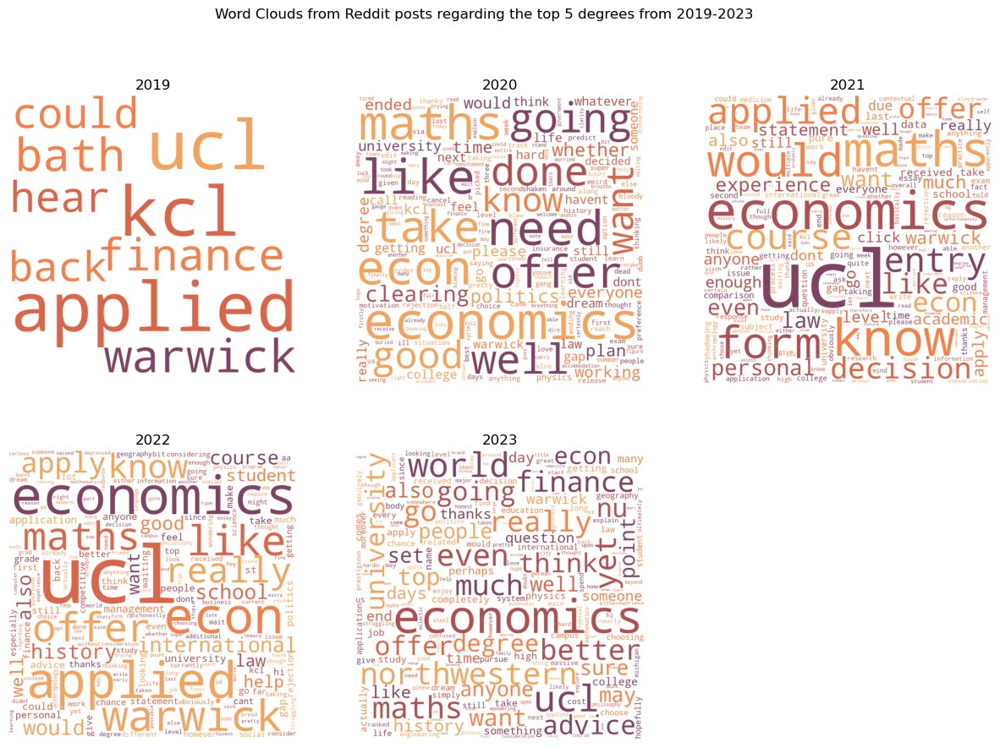

In [21]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
import matplotlib.colors as colors

palette = ['#f2a45e', '#f28149', '#d96648', '#ae5051', '#7f4362']
cmap = colors.ListedColormap(palette)

word_freq_2019 = WordCloud(width=800, height=800, colormap=cmap,background_color='white').generate_from_frequencies(word_freq[2019])
word_freq_2020 = WordCloud(width=800, height=800, colormap=cmap,background_color='white').generate_from_frequencies(word_freq[2020])
word_freq_2021 = WordCloud(width=800, height=800, colormap=cmap,background_color='white').generate_from_frequencies(word_freq[2021])
word_freq_2022 = WordCloud(width=800, height=800, colormap=cmap,background_color='white').generate_from_frequencies(word_freq[2022])
word_freq_2023 = WordCloud(width=800, height=800, colormap=cmap,background_color='white').generate_from_frequencies(word_freq[2023])

fig, axs = plt.subplots(nrows=2, ncols=3, figsize=(15, 10))

axs[0, 0].imshow(word_freq_2019)
axs[0, 0].axis('off')
axs[0, 0].set_title('2019')

axs[0, 1].imshow(word_freq_2020)
axs[0, 1].axis('off')
axs[0, 1].set_title('2020')

axs[0, 2].imshow(word_freq_2021)
axs[0, 2].axis('off')
axs[0, 2].set_title('2021')

axs[1, 0].imshow(word_freq_2022)
axs[1, 0].axis('off')
axs[1, 0].set_title('2022')

axs[1, 1].imshow(word_freq_2023)
axs[1, 1].axis('off')
axs[1, 1].set_title('2023')

axs[1, 2].remove()

plt.suptitle("Word Clouds from Reddit posts regarding the top 5 degrees from 2019-2023")
plt.show()

From the word cloud, we can gather the sentiments of prospective students, since word size increases with frequency. Some of the conclusions we can draw from a first view are that, firstly, the BSc Economics degree is the most popular between 2020-2023. Secondly, when all five degrees are compared to other UK universities, the most common comparisons are with UCL, and then secondly with KCL, but not by much. Another point to note is that many of the posts are related to applications, with vocabulary like "applied," "want," and "offer," due to the nature of the forum. Since BSc Economics has the highest frequency and high mathematical requirements, this can justify the fact that the term "maths" also appears frequently. BSc Accounting and Finance and BSc Management also require relatively good mathematical skills.

Further insight we draw from looking at each year compared to the previous one is that, apart from economics, the second most popular courses change over time:

- In 2019: Not very relevant, as there are too few posts
- In 2020 Politics, in 2021 Law, and in 2022 History, but only slightly
- In 2023: Finance

Regarding the sentiment of the 5 degrees, it's notable that many posts generally express positive sentiment regarding LSE, which might indicate an increase in applications. However, the extent of this varies over the years:

- In 2019: Once again, not very relevant, as there are too few posts.
- In 2020: Generally, this is quite positive, with words such as "offer," "like," "well," "good," and "motivation" being prominent. It also has a relatively large frequency of the word "clearing," which is an interesting point to note, as this could be related to the number of registrations vs. the number of offers in 2020-1 from our data. If this ratio was particularly low, the higher frequency of "clearing" would be justified.
- In 2021: This year has a slightly positive sentiment, but it's almost not discernible initially.
- In 2022: This year doesn't seem to have clear sentiments regarding applications in that year.
- In 2023: This year seems to indicate that prospective students are uncertain about applications towards these degrees, with the use of words such as "advice," "think," and "chance." They seem to be struggling, with the use of words such as "hard," "least," and "confused." Yet they also seem determined, with the use of "dream" and "hopefully."

# <font color='#7f4362'>Conclusion</font>

Our project aimed to understand how the popularity and public perception of LSE's undergraduate degrees has changed from 2015 to 2023 and to gain insights into the changing nature of higher education and the effects of the pandemic on LSE's prospective students. In Part 1, we focused on the data extracted for each department to gain an overall understanding before continuing with the analysis by degree in Part 2. Part 1 data analysis led us to ask more questions, which were more specific to our data and answered more details about our the research questions, as displayed in the data science life cycle. 

From our data we can conclude that the popularity of LSE's undergraduate degrees has increased over time because most departments have expereinced an annual increase in the number of applications, which is shown by the stacked bar chart. The offer rate line graph showed the trends in the difficulty of gaining admission into each department and this fluctuated a lot. Additionally, this is correlated to the number of applications, as seen in 2018-9 and 2021-2. The public perception towards the five degrees have varied greatly over time with the overall sentiment remaining slightly positive, and the sentiments have become more discernable and varied over time with an increase of posts available. For example, the sentiments in 2022-3 are of a wider range than 2020-1.

Our more intricate findings include:
* From Part 1, we observed that within the COVID-19 years, namely 2020-2022, most departments experienced an increase in applications before a steep drop in 2021-22. This could be because students did not receive the predicted grades they needed to apply due to the effects of the pandemic and lockdowns, such as disruption in learning, mental stress, and anxiety. 

* We also discovered an unexpected finding of the sharp increase in applications (and offer rates) for departments in the year 2018-19, which we have yet to find a reasonable explanation for.

* Part 1 EDA showed us that some departments receive many more applications than others, and we wanted to understand why that was because it showed the preferences of applicants, and we could use our data to show how this had changed over time, which Part 2 expanded on.

* The focus on the five undergraduate degrees with the highest number of applicants showed us how the trend of application numbers changed over this crucial time period and left us wanting to explain why these trends had changed. From the word clouds, we analyzed that BSc Economics is consistently the most popular degree in terms of frequency, which supports the second interactive line graph. However, the popularity of the other top degrees has changed over time.

#### Limitations and Moving Forward

It's important to note that the assumption that Reddit data reflects general public opinion is not entirely accurate. The platform's user base skews towards certain demographics, which can lead to a bias in the data. Additionally, Reddit users are more likely to express extreme opinions and emotions, which can further skew the data towards those opinions. Moreover, the limited number of posts we were able to scrape for some years raises questions about the representativeness of our findings. While the analysis of public sentiment on Reddit can provide some insights, it is crucial to keep in mind its limitations and potential biases when interpreting the results. This means that we can't use that data to support some of our conclusions from Part 1.

To continue answering our questions, it would be good to conduct more analysis of public sentiment in 2018 specifically, but also before, to answer the remaining question regarding the steep increase in applications. Additionally, Part 2 of our project showed us the effect that highly regarded degrees can have on the overall department. As the degree becomes responsible for much over 50% of the department, it can skew the data heavily, so we could remove the data regarding these degrees and visualize the new department plots to exactly understand the extent of the skew and also learn more about the degrees with a smaller number of students.

Another potential way to continue this project would be to consider the specific effect of the new degrees, which were not taken into account in our analysis. This limited the project because these new degrees might have had a significant impact on the increase of applications. By analyzing the data for these new degrees, we can gain a better understanding of their popularity and how they contribute to the overall trends. Additionally, we can investigate how the introduction of new degrees affects the other departments and degrees. This would provide a more comprehensive analysis of the changing nature of higher education and the effects of the pandemic on LSE's prospective students.
